<a href="https://colab.research.google.com/github/hw-tan/Capstone-Project/blob/main/4_Modelling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this notebook, we utilise Nvidia RAPIDS - CUDA packages to run cuML NearestNeighbors algorithm on the embeddings extracted in previous notebooks.

From EfficientNetB3 image embeddings we have a 1536 feature size embedding. From LaBSe word embeddings we have 758 feature size embedding.

We find the 50 nearest neighbour in cosine distances and select a threshold that gives the best F1 score on average.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!nvidia-smi

Wed Aug  4 16:12:14 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# https://colab.research.google.com/gist/gumdropsteve/37f544642a0fa9252f3a779141edc064/rapids-colab.ipynb#scrollTo=m0jdXBRiDSzj

In [ ]:
# This get the RAPIDS-Colab install files and test check your GPU.  Run this and the next cell only.
# Please read the output of this cell.  If your Colab Instance is not RAPIDS compatible, it will warn you and give you remediation steps.
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
!python rapidsai-csp-utils/colab/env-check.py

Cloning into 'rapidsai-csp-utils'...
remote: Enumerating objects: 277, done.
remote: Counting objects: 100% (106/106), done.
remote: Compressing objects: 100% (86/86), done.
remote: Total 277 (delta 59), reused 40 (delta 20), pack-reused 171
Receiving objects: 100% (277/277), 80.66 KiB | 1.34 MiB/s, done.
Resolving deltas: 100% (121/121), done.
***********************************************************************
Woo! Your instance has the right kind of GPU, a Tesla T4!
***********************************************************************



In [ ]:
# This will update the Colab environment and restart the kernel.  Don't run the next cell until you see the session crash.
!bash rapidsai-csp-utils/colab/update_gcc.sh
import os
os._exit(00)

Updating your Colab environment.  This will restart your kernel.  Don't Panic!
Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [697 B]
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [836 B]
Get:7 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ Packages [62.9 kB]
Get:8 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:9 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Ign:11 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Package

In [ ]:
# This will install CondaColab.  This will restart your kernel one last time.  Run this cell by itself and only run the next cell once you see the session crash.
import condacolab
condacolab.install()

⏬ Downloading https://github.com/jaimergp/miniforge/releases/latest/download/Mambaforge-colab-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:34
🔁 Restarting kernel...


In [ ]:
# you can now run the rest of the cells as normal
import condacolab
condacolab.check()

✨🍰✨ Everything looks OK!


In [ ]:
# Installing RAPIDS is now 'python rapidsai-csp-utils/colab/install_rapids.py <release> <packages>'
# The <release> options are 'stable' and 'nightly'.  Leaving it blank or adding any other words will default to stable.
# The <packages> option are default blank or 'core'.  By default, we install RAPIDSAI and BlazingSQL.  The 'core' option will install only RAPIDSAI and not include BlazingSQL, 
!python rapidsai-csp-utils/colab/install_rapids.py stable
import os
os.environ['NUMBAPRO_NVVM'] = '/usr/local/cuda/nvvm/lib64/libnvvm.so'
os.environ['NUMBAPRO_LIBDEVICE'] = '/usr/local/cuda/nvvm/libdevice/'
os.environ['CONDA_PREFIX'] = '/usr/local'

Installing RAPIDS Stable 21.06
Starting the RAPIDS+BlazingSQL install on Colab.  This will take about 15 minutes.
Solving environment: ...working... failed with initial frozen solve. Retrying with flexible solve.
Solving environment: ...working... failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: ...working... done

## Package Plan ##

  environment location: /usr/local

  added / updated specs:
    - cudatoolkit=11.0
    - gcsfs
    - llvmlite
    - openssl
    - python=3.7
    - rapids-blazing=21.06


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    abseil-cpp-20210324.1      |       h9c3ff4c_0        1015 KB  conda-forge
    aiohttp-3.7.4.post0        |   py37h5e8e339_0         625 KB  conda-forge
    anyio-3.3.0                |   py37h89c1867_0         146 KB  conda-forge
    argon2-cffi-20.1.0         |   py37h5e8e339_2      

In [ ]:
import cudf, cuml, cupy
from cuml.feature_extraction.text import TfidfVectorizer
from cuml.neighbors import NearestNeighbors
print('RAPIDS',cuml.__version__)

RAPIDS 21.06.02


In [ ]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import gc
import regex as re
from scipy import sparse
from scipy.sparse import hstack
from sklearn.preprocessing import StandardScaler

In [ ]:
# Preprocess dataset
directory = '/content/drive/MyDrive/Capstone/'
train = pd.read_csv(directory + 'Data/train.csv')

train['filepath'] = train['image'].apply(lambda x: f'{directory}Data/train_images/{x}').values

# Create dictionary of items by label group
label_dict = train.groupby('label_group')['posting_id'].unique().to_dict()

# Create list of matching products
train['matches'] = train['label_group'].map(label_dict)

# Create dictionary of items by image_phash
label_dict = train.groupby('image_phash')['posting_id'].unique().to_dict()

# Create list of image duplicates by phash
train['image_duplicates'] = train['image_phash'].map(label_dict)

In [ ]:
train.head()

,posting_id,image,image_phash,title,label_group,filepath,matches,image_duplicates
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_129225211, train_2278313361]",[train_129225211]
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_3386243561, train_3423213080]",[train_3386243561]
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_2288590299, train_3803689425]",[train_2288590299]
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_2406599165, train_3342059966]",[train_2406599165]
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_3369186413, train_921438619]",[train_3369186413]


#### Evaluation Metrics

Submissions will be evaluated based on their mean F1 score. The mean is calculated in a sample-wise fashion, meaning that an F1 score is calculated for every predicted row, then averaged.

In [ ]:
# Function to get our f1 score
def f1_score(y_true, y_pred):
    y_true = y_true.apply(lambda x: set(x))
    if type(y_pred) == list:
      y_pred = [set(x) for x in y_pred]
    else:
      y_pred = y_pred.apply(lambda x: set(x))
    intersection = np.array([len(x[0] & x[1]) for x in zip(y_true, y_pred)])
    len_y_true = y_true.apply(lambda x: len(x)).values
    if type(y_pred) == list:
      len_y_pred = [len(x) for x in y_pred]
    else:
      len_y_pred = y_pred.apply(lambda x: len(x)).values
    
    
    f1 = 2 * intersection / (len_y_pred + len_y_true)
    return f1

Baseline Score

In [ ]:
# Get average F1 score if no predictions were made
f1_score(train['matches'], train['posting_id'].map(lambda x: [x])).mean()

0.4608481791365001

In [ ]:
# Get average F1 score if rely on image PHash
f1_score(train['matches'], train['image_duplicates']).mean()

0.5530933399168149

Baseline scores if all items are predicted as unique is 0.461 average F1 score.

Baseline score if only rely on image preceptual hash to detect duplicate is 0.553.


#### Gridsearching

In this portion we use the embeddings to generate 50 nearest neighbors. Then we set a threshold to determine at what cosine/ euclidian distance do we consider observations to be duplicates.

The threshold with the lowest average F1 score is the ideal threshold.

In [ ]:
def gridsearch(embedding, thresholds, metrics):

  KNN = 50
  model = NearestNeighbors(n_neighbors=KNN, metric = metrics)
  model.fit(embedding)
  
  
  distances, indices = model.kneighbors(embedding)

  for threshold in thresholds:
    threshold = round(threshold,2)
    # Create empty list of prediction
    preds = []
    for k in range(embedding.shape[0]):
        IDX = np.where(distances[k]<threshold)[0]
        IDS = indices[k,IDX]
        o = train.iloc[IDS]['posting_id'].values
        preds.append(o)

    # Get mean f1_score for threshold
    f1 = f1_score(train['matches'],preds).mean()
    print(f'With threshold of {threshold}, the average F1 score is {f1}')
  del model, distances, indices
  _ = gc.collect()


### Image Embedding
Embedding 1 - EfficientNetB3 with no transfer learning

In [ ]:
image_embedding_1 = np.load(f'{directory}Data/image_embedding_1.npy')

In [ ]:
gridsearch(image_embedding_1, np.linspace(0.1,0.3,5), 'cosine')

With threshold of 0.1, the average F1 score is 0.6349761910270231
With threshold of 0.15, the average F1 score is 0.6547365947132109
With threshold of 0.2, the average F1 score is 0.665459374195139
With threshold of 0.25, the average F1 score is 0.6569424220302247
With threshold of 0.3, the average F1 score is 0.6182497915104355


Embedding 2 - EfficientNetB3 with re-training on top_conv (Conv2D)

In [ ]:
image_embedding_2 = np.load(f'{directory}/Data/image_embedding_2.npy')

In [ ]:
gridsearch(image_embedding_2, np.linspace(0.1,0.3,5), 'cosine')

With threshold of 0.1, the average F1 score is 0.6488228040935224
With threshold of 0.15, the average F1 score is 0.6705861796038415
With threshold of 0.2, the average F1 score is 0.6766483754208692
With threshold of 0.25, the average F1 score is 0.6492703470520178
With threshold of 0.3, the average F1 score is 0.5684656057454853


Embedding 3 - EfficientNetB3 with re-training on top_conv (Conv2D), block7b layers



In [ ]:
image_embedding_3 = np.load(f'{directory}/Data/image_embedding_3.npy')

In [ ]:
gridsearch(image_embedding_3, np.linspace(0.1,0.3,5), 'cosine')

With threshold of 0.1, the average F1 score is 0.6418549073561532
With threshold of 0.15, the average F1 score is 0.663830784909456
With threshold of 0.2, the average F1 score is 0.677574731204124
With threshold of 0.25, the average F1 score is 0.6765804124066049
With threshold of 0.3, the average F1 score is 0.6481138316500045


Word Embedding

Embedding 1 - TFIDF Vectorizer

In [ ]:
word_embedding_tfdif = sparse.load_npz(f'{directory}/Data/tfidf_embedding.npz')

In [ ]:
gridsearch(word_embedding_tfdif, np.linspace(0.3,0.5,5), 'cosine')

With threshold of 0.3, the average F1 score is 0.617275954811124
With threshold of 0.35, the average F1 score is 0.6344566203308665
With threshold of 0.4, the average F1 score is 0.6452679794838104
With threshold of 0.45, the average F1 score is 0.6486437948138761
With threshold of 0.5, the average F1 score is 0.6376372556947253


Embedding 2 - LaBSE

In [ ]:
word_embedding_labse = np.load(f'{directory}Data/labse_embeddings.npy')

In [ ]:
gridsearch(word_embedding_labse, np.linspace(0.1,0.3,5), 'cosine')

KeyboardInterrupt: ignored

After searching through different threshold, the best image embedding was from Embedding 3 with a threshold of 0.2 cosine distance. This achieved an average F1 score of 0.67757.

For word embedding, the best word embedding was extracted from TFIDF vectorizer. The threshold is 0.45 cosine distance. This results in an average F1 score of 0.64864.

##### Predictions

In [ ]:
# Create a function that appends predicitons into a list
def predictions(embedding, threshold):

  KNN = 50
  model = NearestNeighbors(n_neighbors=KNN, metric = 'cosine')
  model.fit(embedding)
  
  distances, indices = model.kneighbors(embedding)

  # Create empty list of prediction
  preds = []
  for k in range(embedding.shape[0]):
      IDX = np.where(distances[k]<threshold)[0]
      IDS = indices[k,IDX]
      o = train.iloc[IDS]['posting_id'].values
      preds.append(o)

  return preds

In [ ]:
# Generate predictions
train['image_pred'] = predictions(image_embedding_3, 0.25)
train['tfidf_pred'] = predictions(word_embedding_tfdif, 0.45)
train['labse_pred'] = predictions(word_embedding_labse, 0.2)

In [ ]:
train.head()

,posting_id,image,image_phash,title,label_group,filepath,matches,image_duplicates,image_pred,labse_pred
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_129225211, train_2278313361]",[train_129225211],[train_129225211],"[train_129225211, train_2278313361]"
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_3386243561, train_3423213080]",[train_3386243561],"[train_3386243561, train_3423213080, train_181...","[train_3386243561, train_3423213080, train_211..."
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_2288590299, train_3803689425]",[train_2288590299],[train_2288590299],"[train_2288590299, train_3803689425]"
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_2406599165, train_3342059966]",[train_2406599165],"[train_2406599165, train_3230106292, train_357...","[train_2406599165, train_1744956981, train_352..."
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_3369186413, train_921438619]",[train_3369186413],"[train_3369186413, train_921438619, train_4289...","[train_3369186413, train_921438619]"


**Ensemble Methods**

Union of prediction results. This approach combines the predictions of an image and word model.

In [ ]:
def union_prediction(row):
  x = np.concatenate([row['image_pred'], row['tfidf_pred']])
  return np.unique(x)

train['tfidf_image_pred'] = train.apply(union_prediction,axis = 1)

In [ ]:
def union_prediction(row):
  x = np.concatenate([row['image_pred'], row['labse_pred']])
  return np.unique(x)

train['labse_image_pred'] = train.apply(union_prediction,axis = 1)

In [ ]:
train.head()

,posting_id,image,image_phash,title,label_group,filepath,matches,image_duplicates,image_pred,labse_pred,labse_image_pred
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_129225211, train_2278313361]",[train_129225211],[train_129225211],"[train_129225211, train_2278313361]","[train_129225211, train_2278313361]"
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_3386243561, train_3423213080]",[train_3386243561],"[train_3386243561, train_3423213080, train_181...","[train_3386243561, train_3423213080, train_211...","[train_1816968361, train_1831941588, train_197..."
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_2288590299, train_3803689425]",[train_2288590299],[train_2288590299],"[train_2288590299, train_3803689425]","[train_2288590299, train_3803689425]"
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_2406599165, train_3342059966]",[train_2406599165],"[train_2406599165, train_3230106292, train_357...","[train_2406599165, train_1744956981, train_352...","[train_1508100548, train_1593362411, train_174..."
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_3369186413, train_921438619]",[train_3369186413],"[train_3369186413, train_921438619, train_4289...","[train_3369186413, train_921438619]","[train_3369186413, train_4289809506, train_921..."


In [ ]:
f1_score(train['matches'], train['tfidf_image_pred']).mean()

0.7158348221811394

In [ ]:
f1_score(train['matches'], train['labse_image_pred']).mean()

0.7209576769825976

Combined Embeddings

Another approach to ensemble the results from image and word embeddings is to combine the embedding into 1 combined feature matrix.

We take the Image Embedding 3 and combine it with the tfidf sparse matrix and the LaBSE word embedding array seperately.

Embeddings will be scaled with sklearn standard scaler

image embedding shape - 34250 x 1536

TFIDF vector - 34250 x 25069

LaBSE word embedding - 34250 x 768

-----------------------------------
**Combined Embeddings**

Image + TFIDF - 34250 x 26605

Image + LaBSE - 34250 x 2304

In [ ]:
ss = StandardScaler()
image_combine = ss.fit_transform(image_embedding_3)

Image + TFIDF

In [ ]:
ss = StandardScaler(with_mean = False)
tfidf_combine = ss.fit_transform(word_embedding_tfdif)

In [ ]:
# Combine image embedding and TFIDF Vector
image_combine_m = sparse.csr_matrix(image_combine)
image_tfidf_embedding = hstack((image_combine_m, word_embedding_tfdif)).tocsr()

In [ ]:
image_tfidf_embedding.shape

(34250, 26605)

In [ ]:
gridsearch(image_tfidf_embedding, np.linspace(0.1,0.4,7), 'cosine')

With threshold of 0.1, the average F1 score is 0.6343977936748793
With threshold of 0.15, the average F1 score is 0.6558711488465149
With threshold of 0.2, the average F1 score is 0.6705652964696934
With threshold of 0.25, the average F1 score is 0.6769072090463452
With threshold of 0.3, the average F1 score is 0.6720343643535174
With threshold of 0.35, the average F1 score is 0.642993027197968
With threshold of 0.4, the average F1 score is 0.5819211565688295


Image + LaBSE

In [ ]:
ss = StandardScaler()
labse_combine = ss.fit_transform(word_embedding_labse)

In [ ]:
image_labse_embedding = np.concatenate((image_combine, labse_combine),axis = 1)

In [ ]:
image_labse_embedding.shape

(34250, 2304)

In [ ]:
gridsearch(image_labse_embedding, np.linspace(0.1,0.5,9), 'cosine')

With threshold of 0.1, the average F1 score is 0.538228102172814
With threshold of 0.15, the average F1 score is 0.5927330589015536
With threshold of 0.2, the average F1 score is 0.639775365213395
With threshold of 0.25, the average F1 score is 0.6772732749592768
With threshold of 0.3, the average F1 score is 0.7045611822308174
With threshold of 0.35, the average F1 score is 0.7187565133833442
With threshold of 0.4, the average F1 score is 0.7149301583542143
With threshold of 0.45, the average F1 score is 0.6793802753443917
With threshold of 0.5, the average F1 score is 0.6086890391696315


Looking at the results, we see that LaBSE and Image embeddings combined is a stronger combination than Image embeddings + TFIDF vectorizer. Intuitively it seems that the TFIDF vectorizer does not work well with image embeddings as its a sparse matrix which the nearest neighbor algorithm may under utilise the image embeddings when predicting for duplicates.

The best threshold from gridsearching is 0.35, which returns an F1 score of 0.715.


In [ ]:
# Create list of predictions
train['combined_embedding'] = predictions(image_labse_embedding, 0.35)

In [ ]:
train.head()

,posting_id,image,image_phash,title,label_group,filepath,matches,image_duplicates,image_pred,tfidf_pred,labse_pred,tfidf_image_pred,labse_image_pred,combined_embedding
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_129225211, train_2278313361]",[train_129225211],[train_129225211],"[train_129225211, train_2278313361]","[train_129225211, train_2278313361]","[train_129225211, train_2278313361]","[train_129225211, train_2278313361]",[train_129225211]
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_3386243561, train_3423213080]",[train_3386243561],"[train_3386243561, train_3423213080, train_181...","[train_3386243561, train_3423213080, train_211...","[train_3386243561, train_3423213080, train_211...","[train_1816968361, train_1831941588, train_197...","[train_1816968361, train_1831941588, train_197...","[train_3386243561, train_3423213080, train_212..."
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_2288590299, train_3803689425]",[train_2288590299],[train_2288590299],"[train_2288590299, train_3803689425]","[train_2288590299, train_3803689425]","[train_2288590299, train_3803689425]","[train_2288590299, train_3803689425]","[train_2288590299, train_3803689425]"
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_2406599165, train_3342059966]",[train_2406599165],"[train_2406599165, train_3230106292, train_357...","[train_1744956981, train_2406599165, train_352...","[train_2406599165, train_1744956981, train_352...","[train_1508100548, train_1593362411, train_174...","[train_1508100548, train_1593362411, train_174...","[train_2406599165, train_3576714541, train_352..."
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_3369186413, train_921438619]",[train_3369186413],"[train_3369186413, train_921438619, train_4289...",[train_3369186413],"[train_3369186413, train_921438619]","[train_3369186413, train_4289809506, train_921...","[train_3369186413, train_4289809506, train_921...","[train_3369186413, train_921438619]"


Evaluation

|Model| Cosine   distance Threshold | F1   Score |   |   |
|------------------------------------------------------------------------|-----------------------------|------------|---|---|
| **Baseline**                                                               |                             |            |   |   |
| No predictions                                                         | -                           | 0.461      |   |   |
| Image   PHASH                                                          | -                           | 0.553      |   |   |
| **Image   Models**                                                         |                             |            |   |   |
| Default   EfficientNetB3                                               | 0.2                         | 0.665      |   |   |
| EfficientNetB3,   re-train last layer                                  | 0.2                         | 0.677      |   |   |
| EfficientNetB3,   re-train last layer and last residual block          | 0.25                        | 0.678      |   |   |
| **Text   Models**                                                          |                             |            |   |   |
| TFIDF   Vectorizer                                                     | 0.45                        | 0.648      |   |   |
| LaBSE Embeddings                                                                 | 0.2                         | 0.621      |   |   |
| **Ensemble Models**                                                        |                             |            |   |   |
| Union of Predictions (LaBSE +   EfficientNetB3 w retraining last block)                                        | -                           | 0.721      |   |   |
| Combined Embeddings (LaBSE +   EfficientNetB3 w retraining last block) | 0.35                        | 0.719      |   |   |
| Combined Embeddings (TFIDF +   EfficientNetB3 w retraining last block) | 0.25                        | 0.677      |   |   |


The model with the highest F1 score is the union of predictions.

In [ ]:
train['f1_combine_pred'] = f1_score(train['matches'], train['labse_image_pred'])

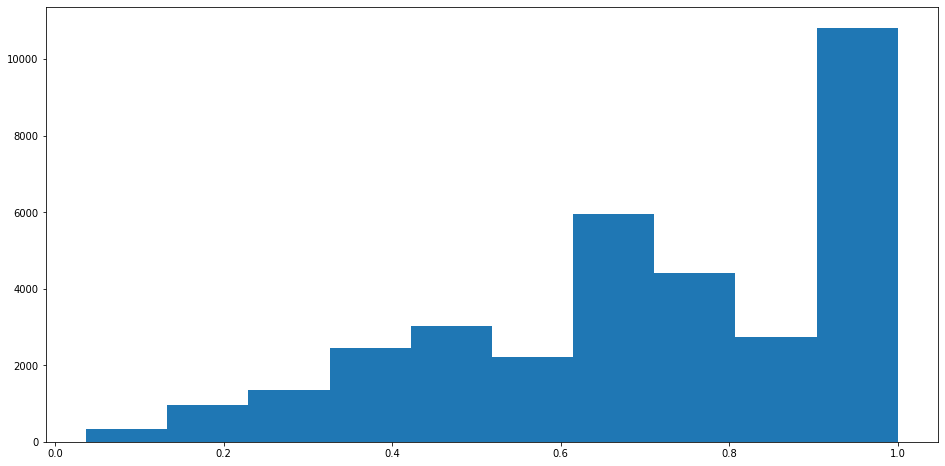

In [ ]:
plt.figure(figsize = (16,8))
plt.hist(train['f1_combine_pred']);


In [ ]:
# Get the number of true duplicates and predicted duplicates
train['num_match'] = train['matches'].map(lambda x: len(x))
train['num_prediction'] = train['labse_image_pred'].map(lambda x: len(x))

In [ ]:
train.head()

,posting_id,image,image_phash,title,label_group,filepath,matches,image_duplicates,image_pred,labse_pred,labse_image_pred,f1_combine_pred,num_match,num_prediction
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_129225211, train_2278313361]",[train_129225211],[train_129225211],"[train_129225211, train_2278313361]","[train_129225211, train_2278313361]",1.000000,2,2
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_3386243561, train_3423213080]",[train_3386243561],"[train_3386243561, train_3423213080, train_181...","[train_3386243561, train_3423213080, train_211...","[train_1816968361, train_1831941588, train_197...",0.363636,2,9
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_2288590299, train_3803689425]",[train_2288590299],[train_2288590299],"[train_2288590299, train_3803689425]","[train_2288590299, train_3803689425]",1.000000,2,2
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_2406599165, train_3342059966]",[train_2406599165],"[train_2406599165, train_3230106292, train_357...","[train_2406599165, train_1744956981, train_352...","[train_1508100548, train_1593362411, train_174...",0.142857,2,12
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_3369186413, train_921438619]",[train_3369186413],"[train_3369186413, train_921438619, train_4289...","[train_3369186413, train_921438619]","[train_3369186413, train_4289809506, train_921...",0.800000,2,3


In [ ]:
# Create function to get correct prediction for best model
def get_correct_preds(row):
  x = np.intersect1d(row['matches'],row['labse_image_pred'])
  return len(x)


In [ ]:
# Get count of correct predictions
train['correct_preds'] = train.apply(lambda x: get_correct_preds(x), axis = 1)

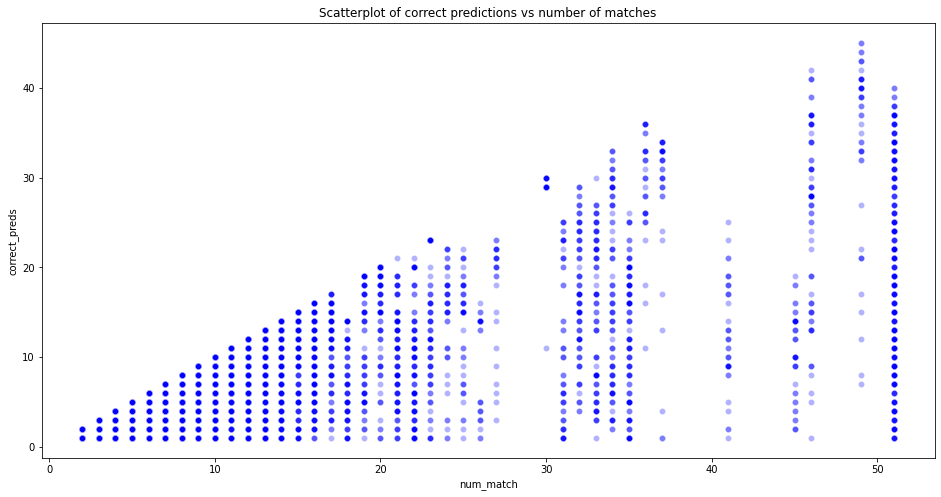

In [ ]:
# Plot diagram
plt.figure(figsize = (16,8))
plt.title('Scatterplot of correct predictions vs number of matches')
sns.scatterplot(x = train['num_match'], y = train['correct_preds'], alpha = 0.3, color = 'blue');

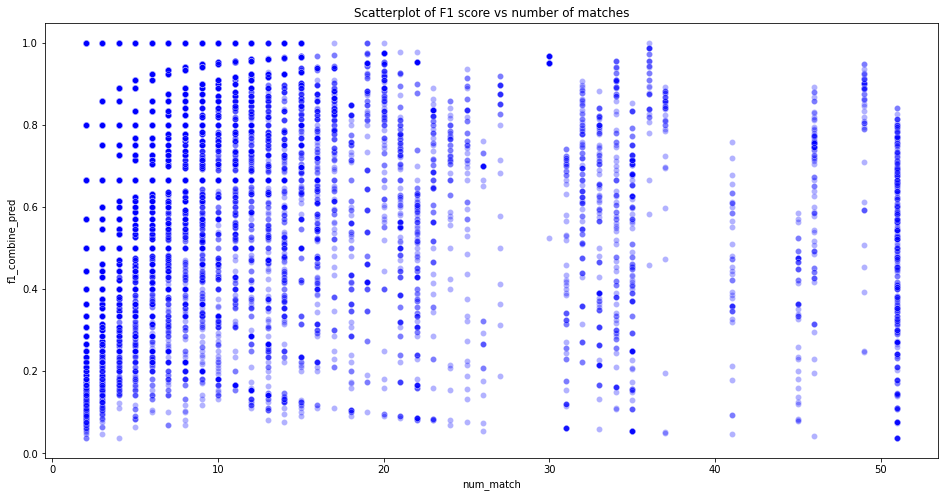

In [ ]:
# Plot diagram
plt.figure(figsize = (16,8))
plt.title('Scatterplot of F1 score vs number of matches')
sns.scatterplot(x = train['num_match'], y = train['f1_combine_pred'], alpha = 0.3, color = 'blue');

In [ ]:
train['num_prediction'] = train['labse_image_pred'].map(lambda x: len(x))

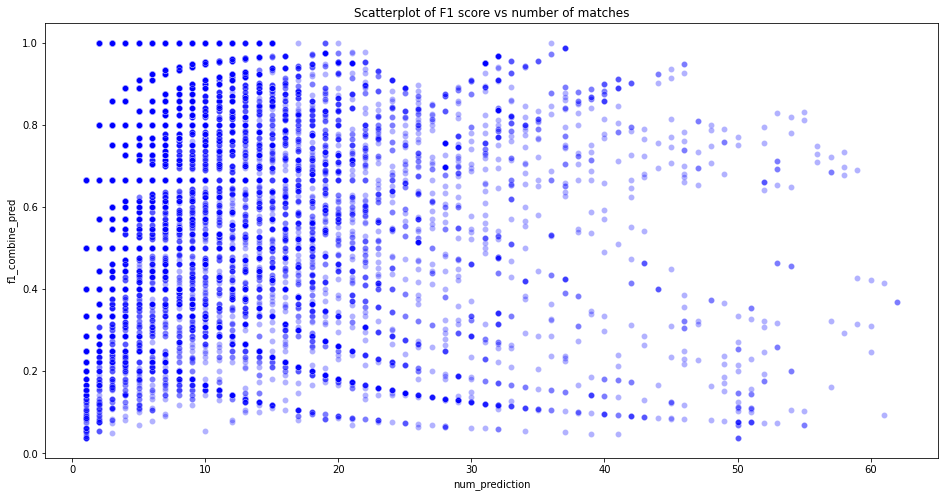

In [ ]:
# Plot diagram
plt.figure(figsize = (16,8))
plt.title('Scatterplot of F1 score vs number of matches')
sns.scatterplot(x = train['num_prediction'], y = train['f1_combine_pred'], alpha = 0.3, color = 'blue');

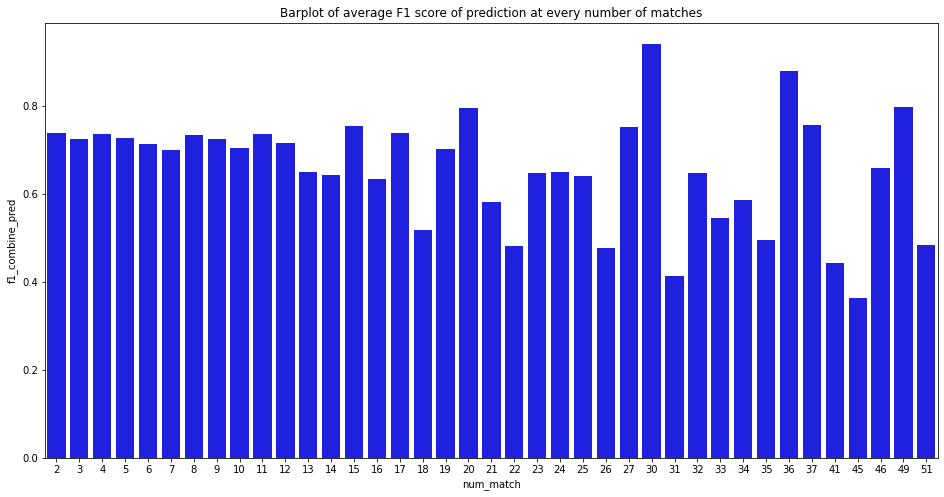

In [ ]:
# Plot average F1 score for predictions at every num of matches
plt.figure(figsize = (16,8))
plt.title('Barplot of average F1 score of prediction at every number of matches')
sns.barplot(
      x = train.groupby('num_match')['f1_combine_pred'].mean().index, 
      y = train.groupby('num_match')['f1_combine_pred'].mean(),
      color = 'blue');

## Misclassification Analysis

Here we analyse items that scored a low average F1 score in the combined predictions. Doing this gives us more insights on the limitation of the model.

Looking at the label_groups with average F1 score of lower than 0.1:


In [ ]:
sorted_f1 = train.groupby('label_group')['f1_combine_pred'].mean().sort_values()
sorted_f1[sorted_f1 < 0.1]

label_group
3797321268    0.068287
971449352     0.072125
1925314826    0.074099
1678524432    0.075758
3157786712    0.075887
3318116205    0.076197
1605252728    0.076923
3018290992    0.081731
2055125008    0.082492
3119971560    0.084220
2251865062    0.084670
904924312     0.092632
3318732110    0.095238
4217152253    0.096110
1660385294    0.097619
3639457321    0.098214
1143378251    0.098901
Name: f1_combine_pred, dtype: float64

In [ ]:
def display_images(label, row, col, title):
    df = train[train['label_group'] == label][:row*col]
    df.reset_index(inplace = True)
    figure, ax = plt.subplots(nrows = row, ncols = col, figsize = (16,16))
    ax = ax.ravel()
    for i, image_path in enumerate(df['filepath']):
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
        #ax[i].set_title(df['title'][i])
        ax[i].imshow(image)
        ax[i].set_axis_off()
    plt.tight_layout()
    plt.show()

In [ ]:
def display_predictions(predictions, row, col, title):
    figure, ax = plt.subplots(nrows = row, ncols = col, figsize = (16,16))
    ax = ax.ravel()
    for i, post_id in enumerate(predictions[:row*col]):
        image_path = train[train['posting_id'] == post_id]['filepath']
        image = cv2.imread(image_path.iloc[0])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
        #ax[i].set_title(df['title'][i])
        ax[i].imshow(image)
        ax[i].set_axis_off()
    plt.tight_layout()
    plt.show()

In [ ]:
def title_predictions(predictions):
    for post_id in predictions:
        title = train[train['posting_id'] == post_id]['title'].values
        print(f'{post_id} - {title}')

#### Examining proudcts with low F1 score

This item listing is for a selfie ring LED lamp. There are only 2 item in this category.

This is a case of incorrect labeling in the dataset, the item is effectively the same as items in the other group that it wrongly predicted.

Problem: Incorrect label

In [ ]:
case1 = train[train['label_group'] == 3797321268]
case1

,posting_id,image,image_phash,title,label_group,filepath,matches,image_duplicates,image_pred,labse_pred,labse_image_pred,f1_combine_pred,num_match,num_prediction,correct_preds,accuracy
21030,train_1924147692,9ded1465ff0f8d0309e4b3ec35fc31ee.jpg,bace85e75a33a086,Selfie ring led lampu pencerah selfie,3797321268,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_1924147692, train_1497105101]",[train_1924147692],[train_1924147692],"[train_1924147692, train_582890927, train_1942...","[train_107168612, train_1204497525, train_1508...",0.074074,2,25,1,0.5
25263,train_1497105101,bd1052d834eaf365ee192f452d4752ff.jpg,9fe0e02fd01ee638,Ring Light Selfie LED / Lampu selfie Bulat unt...,3797321268,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_1924147692, train_1497105101]","[train_107168612, train_1497105101]","[train_1497105101, train_107168612, train_3093...","[train_46242622, train_1497105101, train_20058...","[train_107168612, train_1497105101, train_1508...",0.062500,2,30,1,0.5


In [ ]:
# Count number of image prediction
case1['image_pred'].map(lambda x: len(x))

21030     1
25263    15
Name: image_pred, dtype: int64

In [ ]:
# Count number of word prediction
case1['labse_pred'].map(lambda x: len(x))

21030    25
25263    26
Name: labse_pred, dtype: int64

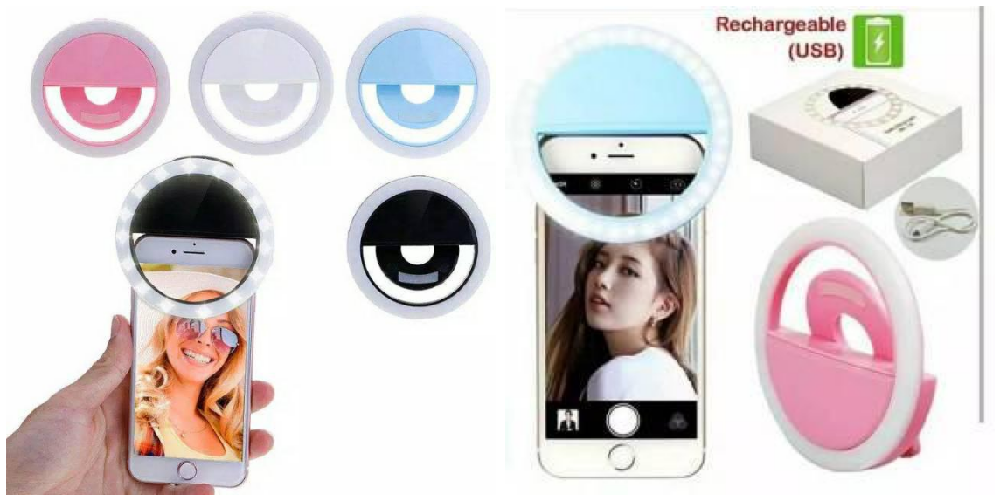

In [ ]:
# Images
display_images(3797321268,1,2,'test')

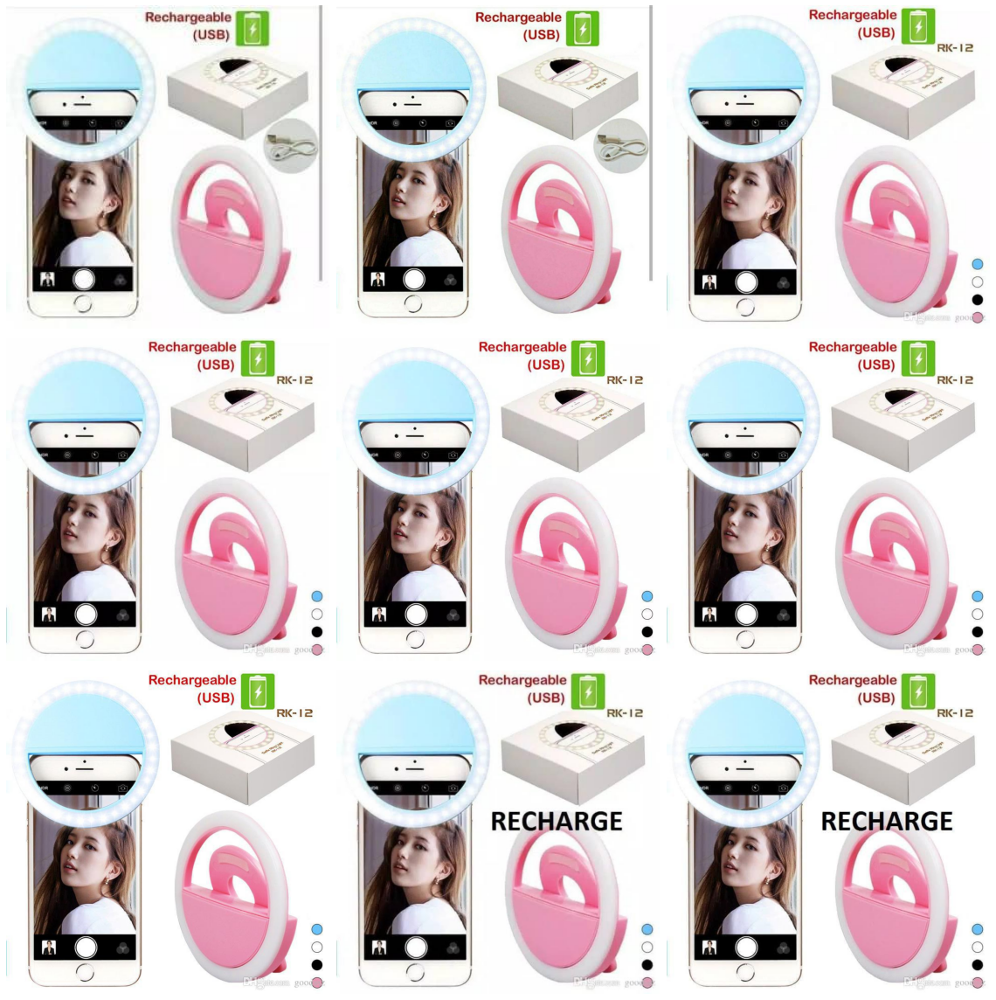

In [ ]:
# Display the predictions
display_predictions(case1['image_pred'].iloc[1], 3, 3, 'test')

In [ ]:
title_predictions(case1['labse_pred'].iloc[0])

train_1924147692 - ['Selfie ring led lampu pencerah selfie']
train_582890927 - ['Ring Light/Led Lampu Selfie']
train_1942584721 - ['Ringlight/ Lampu Selfie Led/ Ring Light']
train_2047463409 - ['RING LIGHT SELFIE LED / LAMPU SELFIE / SELFIE LAMP RING']
train_3525504278 - ['RING LIGHT SELFIE LAMPU LED LAMP SELFI RINGLIGHT']
train_2330331338 - ['SELFIE RING LIGHT/LAMPU RING SELFIE']
train_1204497525 - ['Lampu Selfi - Selfie Ring Light - Ring Light Selfie LED Recharger']
train_2834448264 - ['Selfie Ring Light / Lampu Led Selfie / charm eyes / Lampu Selfie']
train_2691673011 - ['Lampu Selfie Ring Light LED /  Charm Eyes / Lampu Selfie']
train_3075752961 - ['LAMPU RING SELFIE LIGHT']
train_4101881555 - ['Lampu Selfie Ring Light / Ring Selfie light']
train_678655529 - ['Selfie ring light - lampu selfie ring light selfie ']
train_3793240086 - ['Selfie Ring Light Lampu Selfie LED Cahay Lampu Vlog']
train_1508417191 - ['Ring Selfie Light - Lampu Selfie Ring Bulat -  Selfie Lamp Flashlight']
tra

**Case 2**

This item listing is for a handbag. There are 2 items in this label category.

This is a case of incorrect labeling in the dataset, the item is effectively the same as items in the other group that it wrongly predicted.

Problem: Limitation of image embedding, not detailed enough. This highlights an issue with 1 threshold cutoff score, not able to split the minute differences.

In [ ]:
case2 = train[train['label_group'] == 971449352]
case2

,posting_id,image,image_phash,title,label_group,filepath,matches,image_duplicates,image_pred,labse_pred,labse_image_pred,f1_combine_pred,num_match,num_prediction,correct_preds,accuracy
1566,train_139346333,0c2d6ccf4d03c19491c823100bae4e9c.jpg,be94c82f857285cd,Tas Selempang Wanita Import Fashion 7014 93120,971449352,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_139346333, train_420396090]",[train_139346333],"[train_139346333, train_420396090, train_34498...","[train_139346333, train_3540335981, train_4203...","[train_1035029515, train_1049248061, train_111...",0.070175,2,55,2,1.0
6842,train_420396090,33a6766c39d740813c719a64eb20b6ef.jpg,bcc1c237eb34864e,TAS IMPORT FASHION SELEMPANG 93120,971449352,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_139346333, train_420396090]",[train_420396090],"[train_420396090, train_139346333, train_34498...","[train_420396090, train_139346333, train_18507...","[train_1000574656, train_1035029515, train_104...",0.074074,2,52,2,1.0


In [ ]:
# Count number of image prediction
case2['image_pred'].map(lambda x: len(x))

1566    50
6842    50
Name: image_pred, dtype: int64

In [ ]:
# Count number of word prediction
case2['labse_pred'].map(lambda x: len(x))

1566    7
6842    4
Name: labse_pred, dtype: int64

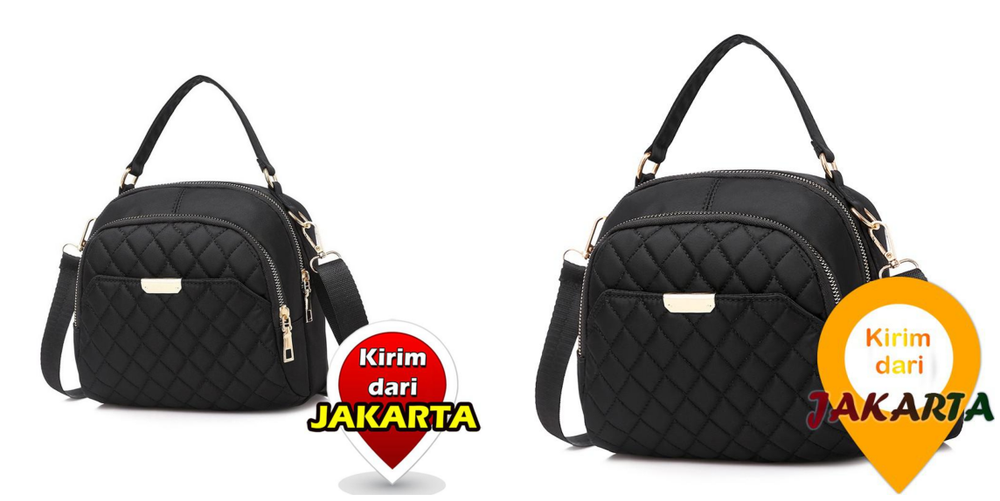

In [ ]:
# Images
display_images(971449352,1,2,'test')

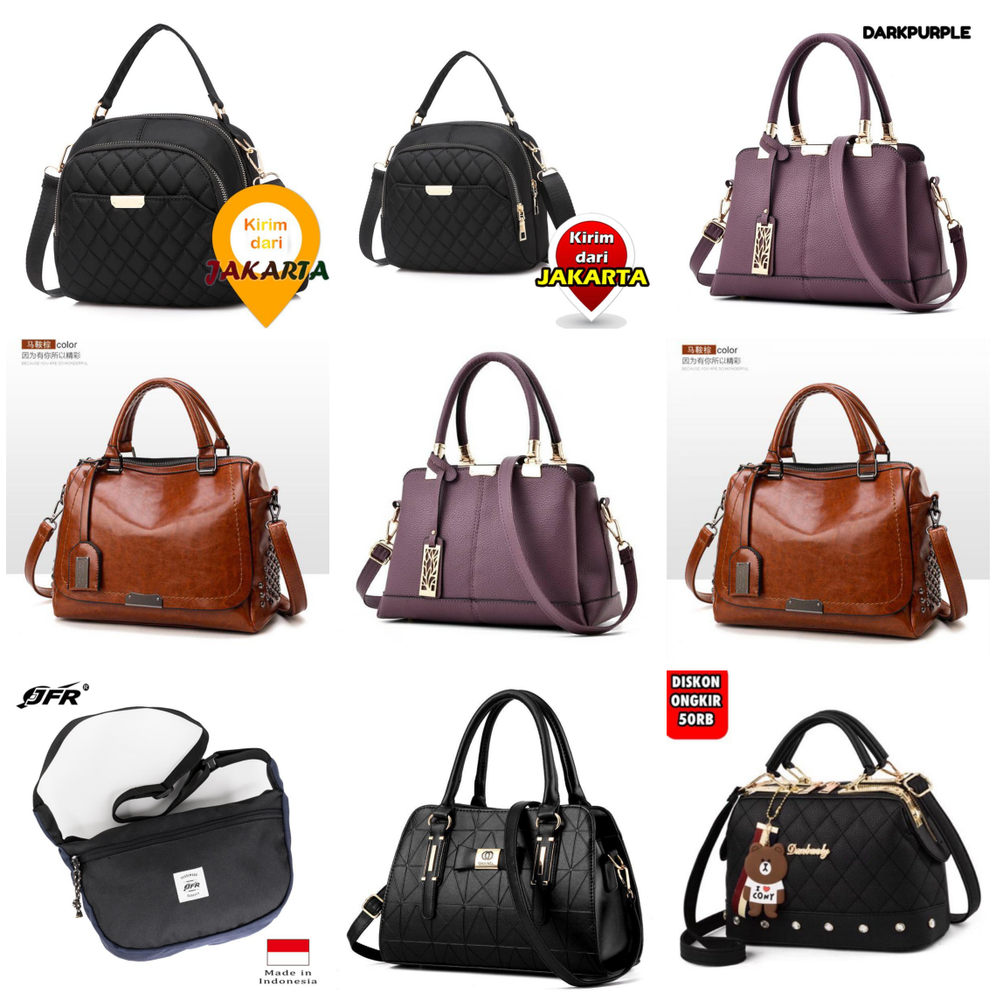

In [ ]:
# Display the predictions
display_predictions(case2['image_pred'].iloc[1], 3, 3, 'test')

In [ ]:
title_predictions(case2['labse_pred'].iloc[0])

train_139346333 - ['Tas Selempang Wanita Import Fashion 7014 93120']
train_3540335981 - ['Tas Selempang Wanita Import Fashion 7092 3236 1736 9030']
train_420396090 - ['TAS IMPORT FASHION SELEMPANG 93120']
train_1855500925 - ['Tas Selempang Wanita Fashion Import Tasbatamrz']
train_627328419 - ['Tas Selempang Wanita Import Fashion 7040 3074 93074 1575/182/N2600/E4270']
train_185070869 - ['TAS IMPORT FASHION RANSEL 93211 7072 17113 e738']
train_1599197154 - ['Tas Selempang Wanita Import Sling Bag 7221 TF2077 L290 T1592 2660 3077 120481']


In [ ]:
f1_score(case2['matches'],case2['labse_pred'])

array([0.44444444, 0.66666667])

**Case 3**

This item listing is for a selfie ring LED lamp. There are only 2 item in this category.

This is a case of incorrect labeling in the dataset, the item is effectively the same as items in the other group that it wrongly predicted.

Problem: Combined results has its limitations, some products are able to be sorted by images, but the title led to an overprediction

In [ ]:
case3 = train[train['label_group'] == 1605252728]
case3

,posting_id,image,image_phash,title,label_group,filepath,matches,image_duplicates,image_pred,labse_pred,labse_image_pred,f1_combine_pred,num_match,num_prediction,correct_preds,accuracy
2064,train_198589528,0feef342c2f68e8b3ac1d8d20865dbd9.jpg,9f1337e2e0983f18,iPhone 5 5S 6 6S 6 Plus 6s PLUS 7 Plus 8 Plus ...,1605252728,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_198589528, train_3363222036]",[train_198589528],"[train_198589528, train_3363222036]","[train_198589528, train_3363222036, train_7078...","[train_1042338739, train_1130742324, train_152...",0.076923,2,50,2,1.0
33606,train_3363222036,fb51f16b410d8a175de78dc3c6cc2fdc.jpg,9f1137e2e0983f1c,Soft Case Transparan Untuk Iphone 5 5s 6 6s 6 ...,1605252728,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_198589528, train_3363222036]",[train_3363222036],"[train_3363222036, train_198589528]","[train_3363222036, train_198589528, train_1764...","[train_1042338739, train_1130742324, train_153...",0.076923,2,50,2,1.0


In [ ]:
# Count number of image prediction
case3['image_pred'].map(lambda x: len(x))

2064     2
33606    2
Name: image_pred, dtype: int64

In [ ]:
# Count number of word prediction
case3['labse_pred'].map(lambda x: len(x))

2064     50
33606    50
Name: labse_pred, dtype: int64

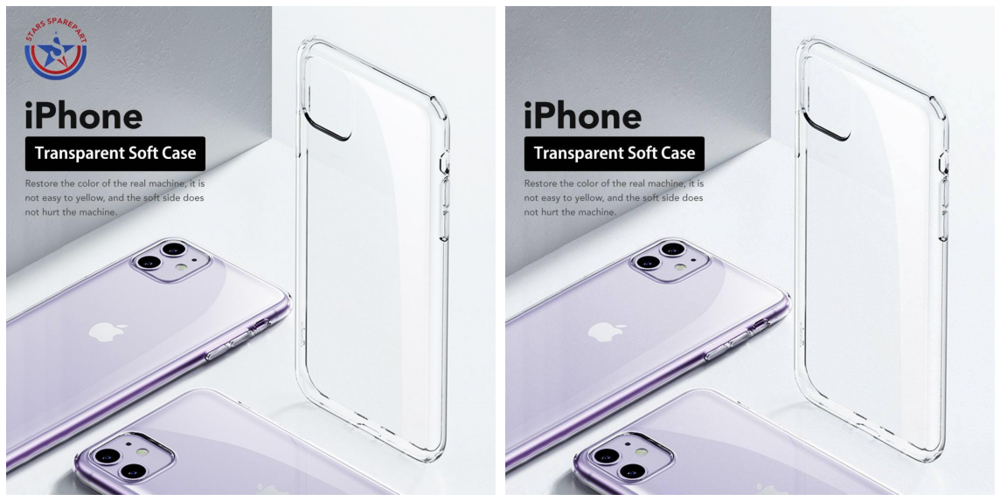

In [ ]:
# Images
display_images(1605252728,1,2,'test')

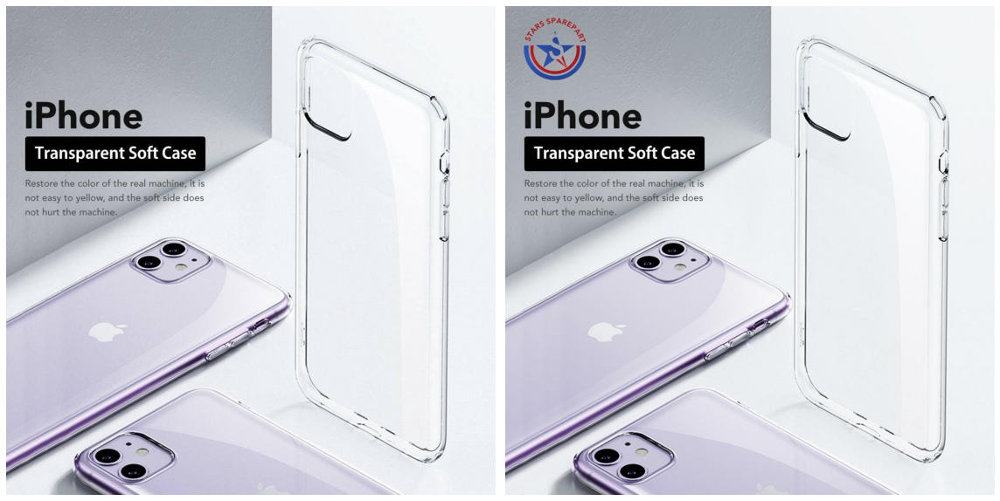

In [ ]:
# Display the predictions
display_predictions(case3['image_pred'].iloc[1], 1, 2, 'test')

In [ ]:
title_predictions(case3['labse_pred'].iloc[0])

train_198589528 - ['iPhone 5 5S 6 6S 6 Plus 6s PLUS 7 Plus 8 Plus X XR XS Max 11 11 Pro Max Transparan Bening Soft Case']
train_3363222036 - ['Soft Case Transparan Untuk Iphone 5 5s 6 6s 6 Plus 6s Plus 7 Plus 8 Plus X Xr Xs Max 11 11 Pro Max']
train_707874029 - ['Tempered Glass IPhone 5 6 6s 7 8 Plus iphone X Xs MAX XR 11 11Pro 12 12 Pro Mini MAX Ultra-thin protector']
train_285976786 - ['ANTI CRACK IPHONE 5/5S/6/6S/6 PLUS/6S PLUS/7/7 PLUS/8/8 PLUS/X/XR/XS/XS MAX/11/11 PRO/11 PRO MAX']
train_663543033 - ['Casing Silikon Matte Frosted Ultra Tipis untuk Apple soft case iPhone 6s Plus /ip 6 Plus / 7 / 7 Plus / 8 Plus iPhone 11 Pro Max Xs Max Xr iX Phone cover']
train_4085161467 - ['Phone case iPhone 11pro Max 7 7Plus 8 8plus XS Max XR 6 6S Plus Frosted SiliconeTPU']
train_3447300518 - ['Soft Casing Silikon Matte Frosted Ultra Tipis untuk Apple iPhone 6 / 6 Plus / 6s Plus / 7 / 7 Plus / 8 Plus SE 2020 XS XR MAX/ iPhone 11 Pro MAX']
train_1611352137 - ['Casing Full Cover Bahan Silikon untuk

High F1 scores

In [ ]:
sorted_f1 = train.groupby('label_group')['f1_combine_pred'].mean().sort_values()
sorted_f1[sorted_f1 > 0.61]

label_group
696596987     0.610101
718508710     0.610101
3220004078    0.610119
927285629     0.610875
1480113982    0.611111
                ...   
2246782164    1.000000
2246482215    1.000000
2245629901    1.000000
2253182510    1.000000
4294197112    1.000000
Name: f1_combine_pred, Length: 7825, dtype: float64

Case 1

This product listing is for instant noodles. Image embedding did a very good job in this case, it manage to capture most duplicates. However word embeddings did a poor job.

This highlights the benefit of using an ensemble method


In [ ]:
case4 = train[train['label_group'] == 2187173784]
case4

,posting_id,image,image_phash,title,label_group,filepath,matches,image_duplicates,image_pred,labse_pred,labse_image_pred,f1_combine_pred,num_match,num_prediction,correct_preds
6550,train_1099694911,31aeed8754c40b4e90c57d402797648c.jpg,b0cfc330cf32cac3,Fitmee Ayam Bawang / Shirataki Ayam Bawang / M...,2187173784,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_1099694911, train_1260859496, train_228...","[train_1099694911, train_3245740312, train_246...","[train_1099694911, train_2468168402, train_324...",[train_1099694911],"[train_1099694911, train_1260859496, train_142...",0.9,9,11,9
7530,train_1260859496,38d1b82e168b562e6078f88e2da99c5c.jpg,dea5d23cc9528972,Fitmee rasa ayam bawang,2187173784,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_1099694911, train_1260859496, train_228...",[train_1260859496],"[train_1260859496, train_2192924447, train_404...",[train_1260859496],"[train_1099694911, train_1260859496, train_142...",0.9,9,11,9
7819,train_2285321448,3af53c52f3925360c49b7ddc3f612aaa.jpg,b0cfc630cf3278c3,Fitmee (Gift),2187173784,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_1099694911, train_1260859496, train_228...","[train_2285321448, train_737444418]","[train_2285321448, train_737444418, train_3245...",[train_2285321448],"[train_1099694911, train_1260859496, train_142...",0.9,9,11,9
7820,train_737444418,3af53c52f3925360c49b7ddc3f612aaa.jpg,b0cfc630cf3278c3,Fitmee Ayam Bawang 71 gr,2187173784,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_1099694911, train_1260859496, train_228...","[train_2285321448, train_737444418]","[train_2285321448, train_737444418, train_3245...",[train_737444418],"[train_1099694911, train_1260859496, train_142...",0.9,9,11,9
9090,train_2957595430,445674d5cd9c44062866501c3a11934c.jpg,b8cfc230cf32cac3,New Fitmee varian ayam bawang,2187173784,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_1099694911, train_1260859496, train_228...",[train_2957595430],"[train_2957595430, train_2468168402, train_324...",[train_2957595430],"[train_1099694911, train_1260859496, train_142...",0.9,9,11,9
15934,train_1428851119,780c16d1552ef038e15b6994a5a0542d.jpg,b9cf9469c33cc330,Fitmee Mie Instant Low Carbo Fit mee Ayam Bawang,2187173784,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_1099694911, train_1260859496, train_228...","[train_1428851119, train_3729222615]","[train_1428851119, train_3729222615, train_246...","[train_1428851119, train_3729222615]","[train_1099694911, train_1260859496, train_142...",0.9,9,11,9
27728,train_3245740312,cf906bcd08afb3ea19556647f27ec68c.jpg,b0cfc330cf32cac3,Fit Mee Mie Shirataki Rasa Ayam Bawang Diet Keto,2187173784,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_1099694911, train_1260859496, train_228...","[train_1099694911, train_3245740312, train_246...","[train_3245740312, train_2468168402, train_109...",[train_3245740312],"[train_1099694911, train_1260859496, train_142...",0.9,9,11,9
31293,train_3729222615,eaae94185447b0efdb9d4b349edaeff3.jpg,b9cf9469c33cc330,Fitmee Fit Mee Mi isntant low carbo ayam bawang,2187173784,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_1099694911, train_1260859496, train_228...","[train_1428851119, train_3729222615]","[train_3729222615, train_1428851119, train_246...","[train_3729222615, train_1428851119]","[train_1099694911, train_1260859496, train_142...",0.9,9,11,9
31795,train_2468168402,ee441875a602b4b7baa6d298b4f7bd87.jpg,b0cfc330cf32cac3,Fitmee RASA AYAM BAWANG mie instan sehat dari ...,2187173784,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_1099694911, train_1260859496, train_228...","[train_1099694911, train_3245740312, train_246...","[train_2468168402, train_3245740312, train_109...",[train_2468168402],"[train_1099694911, train_1260859496, train_142...",0.9,9,11,9


In [ ]:
case4['num_prediction']

6550     11
7530     11
7819     11
7820     11
9090     11
15934    11
27728    11
31293    11
31795    11
Name: num_prediction, dtype: int64

In [ ]:
# Count number of image prediction
case4['image_pred'].map(lambda x: len(x))

6550     11
7530     11
7819     11
7820     11
9090     11
15934    11
27728    11
31293    11
31795    11
Name: image_pred, dtype: int64

In [ ]:
# Count number of word prediction
case4['labse_pred'].map(lambda x: len(x))

6550     1
7530     1
7819     1
7820     1
9090     1
15934    2
27728    1
31293    2
31795    1
Name: labse_pred, dtype: int64

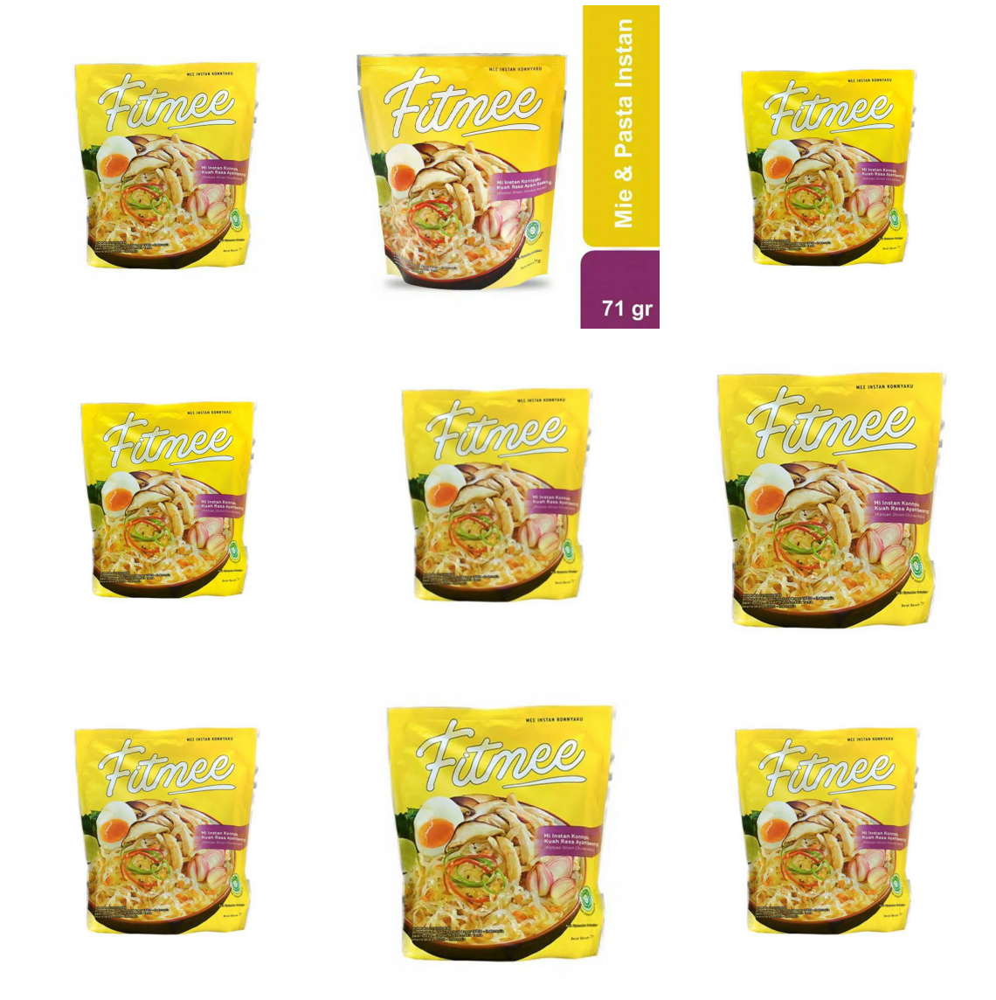

In [ ]:
# Images
display_images(2187173784,3,3,'test')

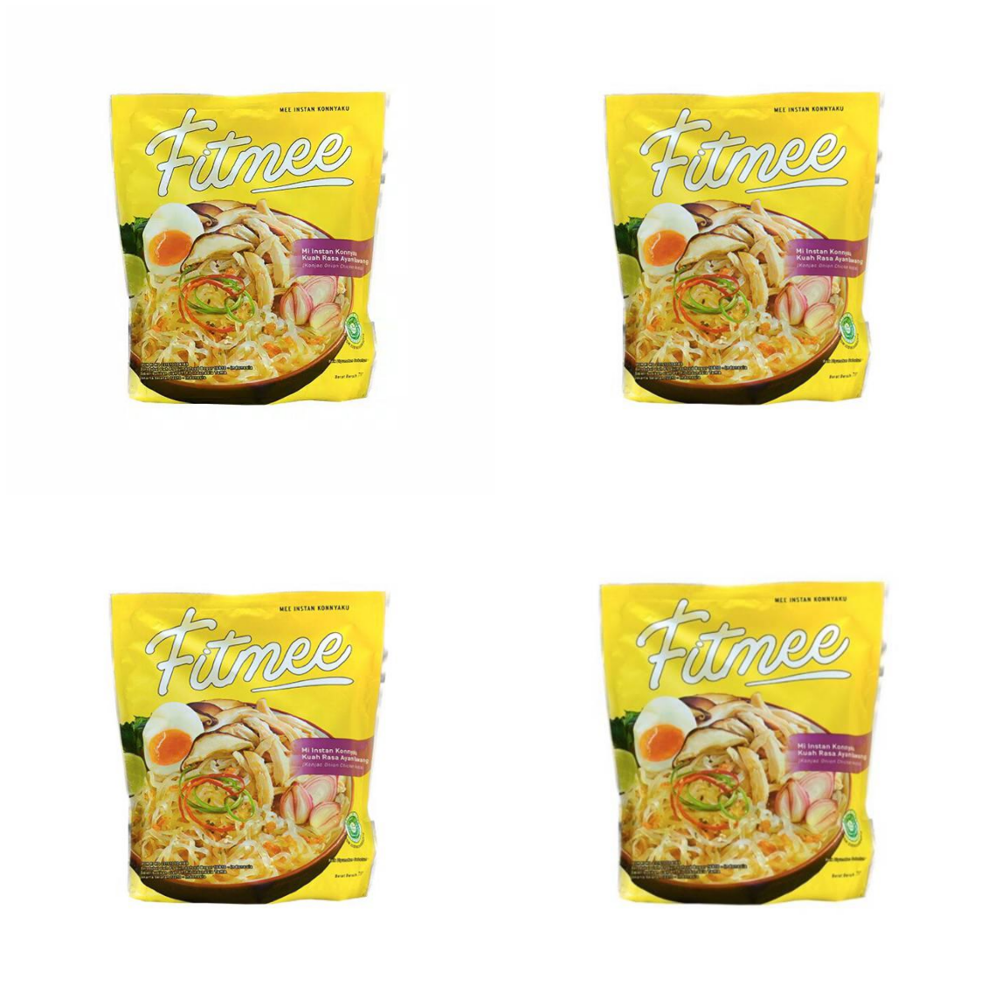

In [ ]:
# Display the predictions
display_predictions(case4['image_pred'].iloc[0], 2, 2, 'test')

In [ ]:
case4['title']

6550     Fitmee Ayam Bawang / Shirataki Ayam Bawang / M...
7530                               Fitmee rasa ayam bawang
7819                                         Fitmee (Gift)
7820                              Fitmee Ayam Bawang 71 gr
9090                         New Fitmee varian ayam bawang
15934     Fitmee Mie Instant Low Carbo Fit mee Ayam Bawang
27728     Fit Mee Mie Shirataki Rasa Ayam Bawang Diet Keto
31293      Fitmee Fit Mee Mi isntant low carbo ayam bawang
31795    Fitmee RASA AYAM BAWANG mie instan sehat dari ...
Name: title, dtype: object

Case 5: 

This product catagory is difficult, the images are very different and description varies alot.

Model show some success in classifying difficult.

In [ ]:
case5 = train[train['label_group'] == 927285629]
case5

,posting_id,image,image_phash,title,label_group,filepath,matches,image_duplicates,image_pred,labse_pred,labse_image_pred,f1_combine_pred,num_match,num_prediction,correct_preds
445,train_667320315,039ad17208e4d282f9db05402113e905.jpg,d3b2f97322023af8,INNISFREE MY REAL SQUEEZE SHEET MASK 23ml 40p...,927285629,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_667320315, train_2023772242, train_1763...",[train_667320315],"[train_667320315, train_4143731129, train_1132...","[train_667320315, train_2492609852, train_4214...","[train_1132571023, train_2492609852, train_375...",0.344828,23,6,5
4740,train_2023772242,23ce2045efa94986b5f416b76064c52a.jpg,ef8fb0b057ef2010,[BISA COD] Innisfree My Real Squeeze Mask Sheet,927285629,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_667320315, train_2023772242, train_1763...",[train_2023772242],[train_2023772242],"[train_2023772242, train_1638640094, train_113...","[train_1132571023, train_1634598069, train_163...",0.516129,23,8,8
5747,train_1763921654,2b3a5006cfbc8a008716db090a4f23f6.jpg,bf1edc09c119dc16,INNISFREE MY REAL SQUEEZE MASK (BACA DISCLAIME...,927285629,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_667320315, train_2023772242, train_1763...",[train_1763921654],"[train_1763921654, train_4214328043, train_795...","[train_1763921654, train_1638640094, train_113...","[train_1089119523, train_1132571023, train_117...",0.685714,23,12,12
6033,train_795964177,2dc406dfd914a49f58fc78d3ac5ac856.jpg,be9fe08dc5624b60,INNISFREE MY REAL SQUEEZE MASK SHEET (NEW PACK...,927285629,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_667320315, train_2023772242, train_1763...",[train_795964177],"[train_795964177, train_1763921654, train_4214...","[train_795964177, train_1910955374, train_2559...","[train_1038088836, train_1132571023, train_117...",0.820513,23,16,16
6767,train_1174605619,333555a20610e0fb5229a067554f4f1b.jpg,e89fc57192c3835c,Innisfree Sheet Mask My Real Squeeze Baca Disc...,927285629,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_667320315, train_2023772242, train_1763...","[train_1174605619, train_2559568500, train_297...","[train_1174605619, train_2971294916, train_375...","[train_1174605619, train_3011299229, train_251...","[train_1038088836, train_1132571023, train_117...",0.736842,23,15,14
9818,train_3755737508,498ec22c3c388d93ab0bd2ae0f207735.jpg,e99fc57192c3825c,NEW INNISFREE My Real Squeeze Mask Sheetmask M...,927285629,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_667320315, train_2023772242, train_1763...",[train_3755737508],"[train_3755737508, train_2971294916, train_314...","[train_3755737508, train_2492609852, train_667...","[train_1038088836, train_1132571023, train_117...",0.702703,23,14,13
9839,train_4214328043,49c4a7eb3fc6fcd284dc887c95957af2.jpg,fe3694c9c1c9a436,INNISFREE SHEET MASK MY REAL SQUEEZE [1KG MUAT...,927285629,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_667320315, train_2023772242, train_1763...",[train_4214328043],"[train_4214328043, train_1763921654, train_795...","[train_4214328043, train_2492609852, train_667...","[train_1132571023, train_1763921654, train_191...",0.516129,23,8,8
10347,train_3011299229,4d91b8f172668613cf5fffb3abf635c1.jpg,ea55b280e16f8db4,Innisfree My Real Squeeze Mask Masker Wajah Sh...,927285629,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_667320315, train_2023772242, train_1763...","[train_3011299229, train_880831035, train_2492...","[train_3011299229, train_880831035, train_2492...","[train_3011299229, train_1910955374, train_117...","[train_1089119523, train_1132571023, train_117...",0.714286,23,19,15
10348,train_880831035,4d91b8f172668613cf5fffb3abf635c1.jpg,ea55b280e16f8db4,"b""INNISFREE IT'S REAL SQUEEZE MASK / MASKER TO...",927285629,/content/drive/MyDrive/Capstone/Data/train_ima...,"[train_667320315, train_2023772242, train_1763...","[train_3011299229, train_880831035, train_2492...","[train_3011299229, train_880831035, train_2492...","[train_880

In [ ]:
# Count number of image prediction
case5['image_pred'].map(lambda x: len(x))

445       3
4740      1
5747      5
6033      4
6767     10
9818     10
9839      4
10347     6
10348     6
13475     5
16977     4
19324    10
20815     4
20816     4
20817     4
20899    10
21940    11
24078     6
24164     4
25251    10
25647    10
30726     9
32054    10
Name: image_pred, dtype: int64

In [ ]:
# Count number of word prediction
case5['labse_pred'].map(lambda x: len(x))

445       4
4740      8
5747     10
6033     15
6767     10
9818      6
9839      5
10347    15
10348     4
13475     1
16977    10
19324     2
20815     2
20816    11
20817     5
20899    10
21940    11
24078     4
24164    16
25251     7
25647     7
30726    10
32054     2
Name: labse_pred, dtype: int64

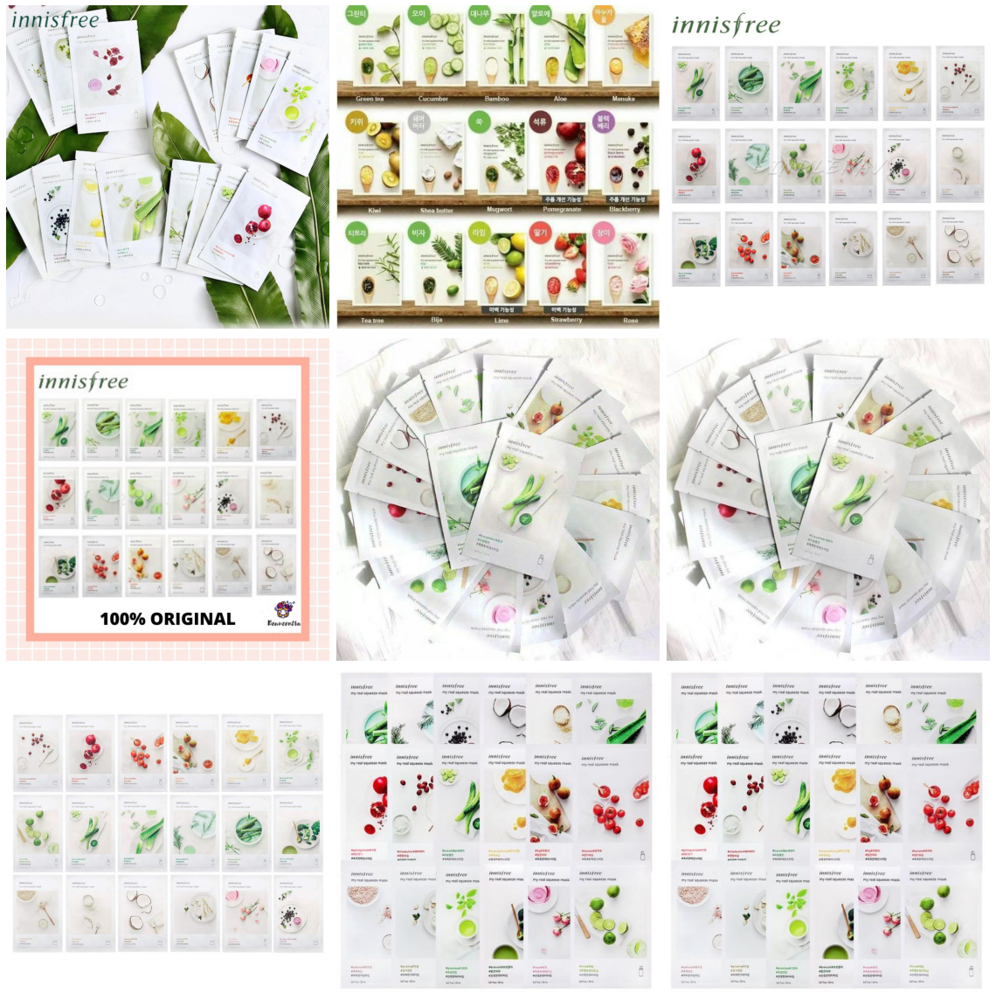

In [ ]:
# Images
display_images(927285629,3,3,'test')

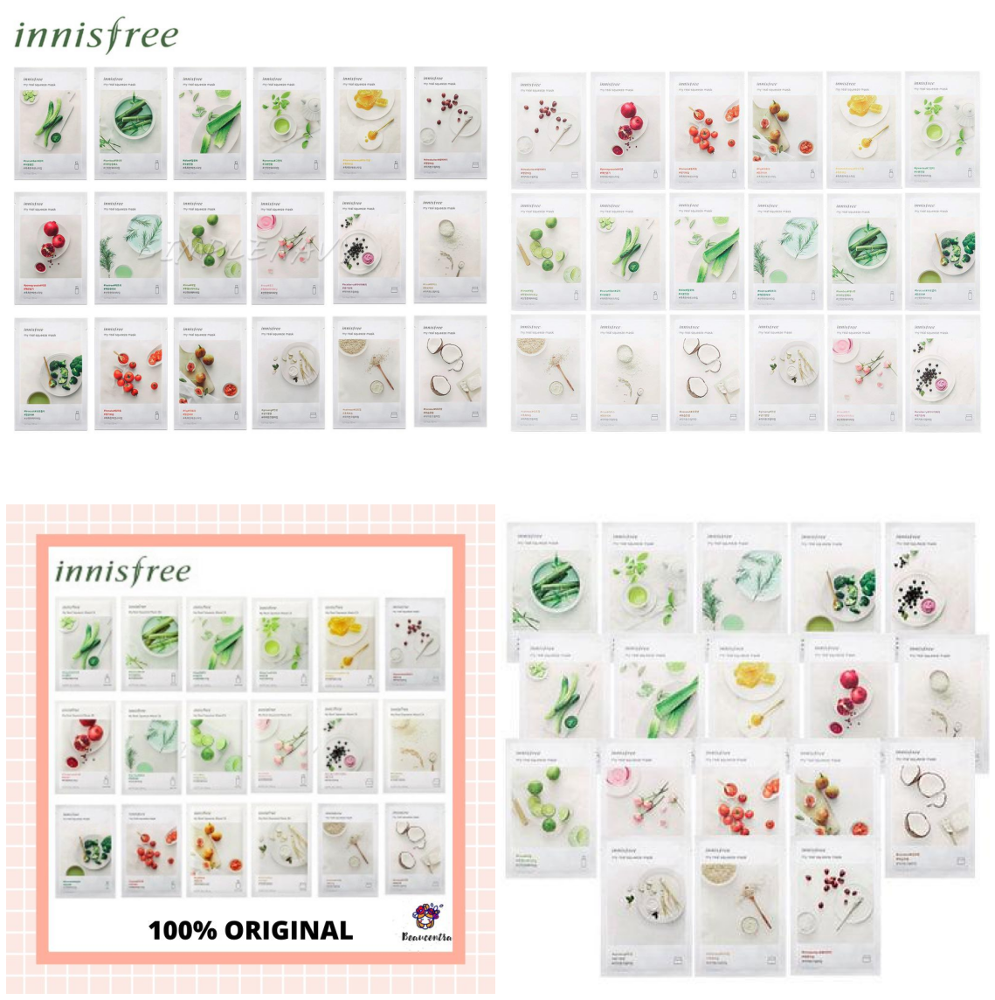

In [ ]:
# Display the predictions
display_predictions(case5['image_pred'].iloc[2], 2, 2, 'test')

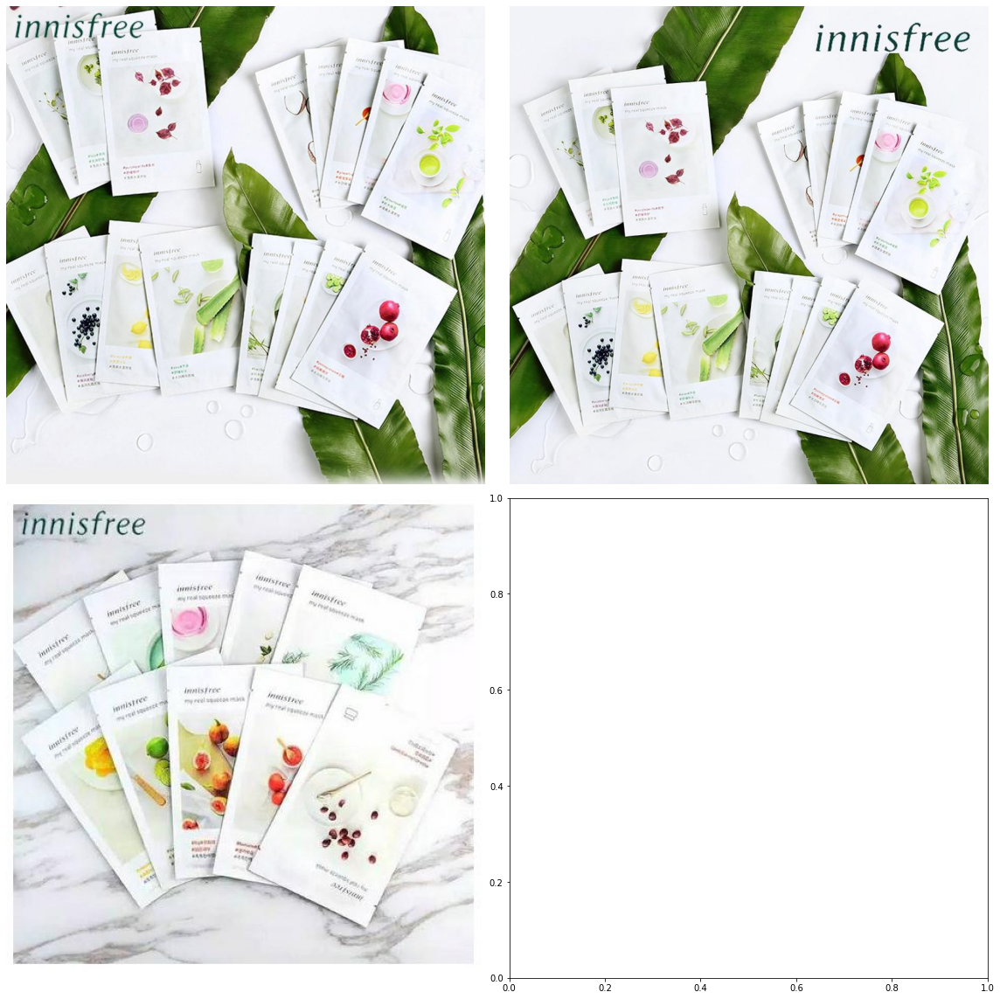

In [ ]:
display_predictions(case5['image_pred'].iloc[0], 2, 2, 'test')


In [ ]:
title_predictions(case5['labse_pred'].iloc[3])

train_795964177 - ['INNISFREE MY REAL SQUEEZE MASK SHEET (NEW PACKING) ORIGINAL']
train_1910955374 - ['(NEW) INNISFREE MY REAL SQUEEZE MASK SHEET ORIGINAL MASKER']
train_2559568500 - ['NEW EDITION INNISFREE MY REAL SQUEEZE MASK']
train_1634598069 - ['innisfree my real squeeze mask ORIGINAL!']
train_1638640094 - ['Innisfree My Real Squeeze Mask Sheet']
train_2512107236 - ['MASKER INNISFREE PROMO , INNISFREE MY REAL SQUEEZE SHEET MASK NEW PACKING ORIGINAL MASKER TISSUE']
train_1038088836 - ['INNISFREE MY REAL SQUEEZE MASK SHEET (NEW PACKING) (READY STOK) 100%ORIGINAL KOREA']
train_1132571023 - ['INNISFREE SHEET MASK MY REAL SQUEEZE']
train_2971294916 - ['BEST SELLER READY MASKER INNISFREE PROMO - INNISFREE MY REAL SQUEEZE SHEET MASK NEW PACKING ORIGINAL']
train_3011299229 - ['Innisfree My Real Squeeze Mask Masker Wajah Sheet Mask']
train_1763921654 - ['INNISFREE MY REAL SQUEEZE MASK (BACA DISCLAIMER !!!)']
train_1922564626 - ['original Innisfree my real squeeze mask ga jual.kw kw!']
trai

# Conclusion

We are to a large extent able to classify product listings based on the image and text data.

We observed some weakness in the model predictive power when it came to similar images. Further improvements can include, using stronger CNN models like EfficientNetB4 - 7. We can also explore re-training more layers in the EfficientNetB3 model used, this may help it better differentiate the products.

For word embedding, we can improve the model further pre-processing the data. An e-commerce list of stopwords will be a good addition. We observed wrong predictions with word predictions due to 'e-commerce' filler words used by the sellers.